In [1]:
import librosa
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [2]:
path = 'audio/2478501_713854278.m4a'
y,sr = librosa.load(path)

In [5]:
hop_length = 100
onset_env = librosa.onset.onset_strength(y, sr=sr, hop_length=hop_length)
onset_samples = librosa.onset.onset_detect(y,

                                           sr=sr, units='samples', 
                                           hop_length=hop_length, 
                                           backtrack=False,
                                           pre_max=20,
                                           post_max=20,
                                           pre_avg=100,
                                           post_avg=100,
                                           delta=0.2,
                                           wait=0)

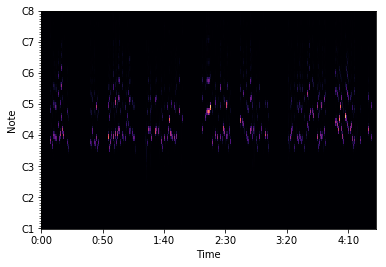

In [8]:
import librosa.display
plt
onset_samples
cqt = librosa.cqt(y, sr=sr)
librosa.display.specshow(abs(cqt), sr=sr, x_axis='time', y_axis='cqt_note')

In [10]:
def estimate_pitch(segment, sr, fmin=50.0, fmax=2000.0):
    
    # Compute autocorrelation of input segment.
    r = librosa.autocorrelate(segment)
    
    # Define lower and upper limits for the autocorrelation argmax.
    i_min = sr/fmax
    i_max = sr/fmin
    r[:int(i_min)] = 0
    r[int(i_max):] = 0
    
    # Find the location of the maximum autocorrelation.
    i = r.argmax()
    f0 = float(sr)/i
    return f0

In [12]:
def estimate_pitch_and_generate_sine(y, onset_samples, i, sr):
    n0 = onset_samples[i]
    n1 = onset_samples[i+1]
    f0 = estimate_pitch(y[n0:n1], sr)
    return generate_sine(f0, sr, n1-n0)

In [11]:
variable=0
pitch_array = []
for i in onset_samples:
    new_array = y[variable:i]
    print(estimate_pitch(new_array, sr, fmin=50.0, fmax=500.0))
    pitch_array.append((estimate_pitch(new_array, sr, fmin=50.0, fmax=500.0)))
    variable=i

139.55696202531647
242.30769230769232
265.66265060240966
250.5681818181818
259.4117647058824
324.2647058823529
245.0
208.0188679245283
242.30769230769232
297.97297297297297
329.1044776119403
275.625
380.17241379310343
259.4117647058824
294.0
310.5633802816901
253.44827586206895
232.10526315789474
193.42105263157896
262.5
268.9024390243902
206.07476635514018
237.09677419354838
222.72727272727272
268.9024390243902
220.5
290.13157894736844
234.5744680851064
232.10526315789474
242.30769230769232
282.6923076923077
256.3953488372093
253.44827586206895
262.5
262.5
220.5
265.66265060240966
247.75280898876406
344.53125
256.3953488372093
297.97297297297297
302.05479452054794
256.3953488372093
344.53125
265.66265060240966
290.13157894736844
234.5744680851064
286.3636363636364
294.0
210.0
286.3636363636364
290.13157894736844
227.31958762886597
294.0
350.0
286.3636363636364
290.13157894736844
220.5
247.75280898876406
237.09677419354838
234.5744680851064
239.67391304347825
245.0
242.30769230769232
2

In [15]:
def generate_sine(f0, sr, n_duration):
    n = np.arange(n_duration)
    return 0.2*np.sin(2*np.pi*f0*n/float(sr))
onset_boundaries = np.concatenate([[0], onset_samples, [len(y)]])
y3 = np.concatenate([
    estimate_pitch_and_generate_sine(y, onset_boundaries, i, sr=sr)
    for i in range(len(onset_boundaries)-1)
])

In [16]:
import IPython.display as ipd
ipd.Audio(y3, rate=sr)

In [17]:
len(pitch_array)

153

In [22]:
y2=y[661500:1984500]
len(y2)

1323000

In [23]:
hop_length = 100
onset_env = librosa.onset.onset_strength(y2, sr=sr, hop_length=hop_length)
onset_samples = librosa.onset.onset_detect(y2,

                                           sr=sr, units='samples', 
                                           hop_length=hop_length, 
                                           backtrack=False,
                                           pre_max=20,
                                           post_max=20,
                                           pre_avg=100,
                                           post_avg=100,
                                           delta=0.2,
                                           wait=0)

In [24]:
variable=0
pitch_array = []
for i in onset_samples:
    new_array = y2[variable:i]
    print(estimate_pitch(new_array, sr, fmin=50.0, fmax=500.0))
    pitch_array.append((estimate_pitch(new_array, sr, fmin=50.0, fmax=500.0)))
    variable=i

262.5
268.9024390243902
206.07476635514018
237.09677419354838
222.72727272727272
268.9024390243902
220.5
290.13157894736844
234.5744680851064
232.10526315789474
242.30769230769232
282.6923076923077
256.3953488372093
253.44827586206895
262.5
262.5
220.5
265.66265060240966
247.75280898876406
339.2307692307692
256.3953488372093
297.97297297297297
302.05479452054794
256.3953488372093
344.53125
265.66265060240966
290.13157894736844
234.5744680851064
286.3636363636364


In [25]:
len(pitch_array)

29

In [193]:
df = pd.read_csv('perfs.csv')
df1=df.head(150)
df1["songid"].unique()

array(['_7_years', '_closer', '_lost_boy', '_rockabye',
       '_say_you_wont_let_go', '_all_of_me_john_legend', '_one_call_away',
       '_despacito', '_love_yourself', '_more_than_words'], dtype=object)

In [194]:
df1.head()

,plyrid,perf_key,songid,gender,birthyear,country
0,2478501,2478501_836544509,_7_years,F,1996.0,GB
1,2478501,2478501_750921010,_closer,F,1996.0,GB
2,2478501,2478501_713854278,_lost_boy,F,1996.0,GB
3,2478501,2478501_1061641085,_rockabye,F,1996.0,GB
4,2478501,2478501_1185645486,_say_you_wont_let_go,F,1996.0,GB


In [195]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.utils import to_categorical

In [196]:
from numpy.random import seed
seed(1)
import tensorflow
tensorflow.keras.__version__

'2.2.4-tf'

In [258]:
perf_key_list = list(df1["perf_key"])

In [287]:
voice_array = []
for perf in perf_key_list:
    path = 'audio/'+perf+'.m4a'
    y,sr = librosa.load(path)
    hop_length = 256
    y2=y[661500:1984500]
    onset_env = librosa.onset.onset_strength(y2, sr=sr, hop_length=hop_length)
    onset_samples = librosa.onset.onset_detect(y2,

                                           sr=sr, units='samples', 
                                           hop_length=hop_length, 
                                           backtrack=False,
                                           pre_max=20,
                                           post_max=20,
                                           pre_avg=100,
                                           post_avg=100,
                                           delta=0.2,
                                           wait=0)
    variable=0
    pitch_array = []
    for i in onset_samples:
        new_array = y2[variable:i]
        new_array1=new_array[:int((len(new_array))/10)]
        new_array2=new_array[int((len(new_array))/10):int(((len(new_array))/10)*2)]
        new_array3=new_array[int((len(new_array))/5):int(((len(new_array))/10)*3)]
        new_array4=new_array[int(((len(new_array))/10)*3):int(((len(new_array))/10)*4)]
        new_array5=new_array[int(((len(new_array))/5)*2):int(((len(new_array))/10)*5)]
        new_array6=new_array[int((len(new_array))/2):int(((len(new_array))/10)*6)]
        new_array7=new_array[int(((len(new_array))/5)*3):int(((len(new_array))/10)*7)]
        new_array8=new_array[int(((len(new_array))/10)*7):int(((len(new_array))/10)*8)]
        new_array9=new_array[int(((len(new_array))/10)*8):int(((len(new_array))/10)*9)]
        new_array10=new_array[-int((len(new_array))/10):]
        #new_array2=y2[(int((i-variable)/2)):i]
        #print(estimate_pitch(new_array, sr, fmin=50.0, fmax=500.0))
        pitch_array.append((estimate_pitch(new_array1, sr, fmin=50.0, fmax=500.0)))
        pitch_array.append((estimate_pitch(new_array2, sr, fmin=50.0, fmax=500.0)))
        pitch_array.append((estimate_pitch(new_array3, sr, fmin=50.0, fmax=500.0)))
        pitch_array.append((estimate_pitch(new_array4, sr, fmin=50.0, fmax=500.0)))
        pitch_array.append((estimate_pitch(new_array5, sr, fmin=50.0, fmax=500.0)))
        pitch_array.append((estimate_pitch(new_array6, sr, fmin=50.0, fmax=500.0)))
        pitch_array.append((estimate_pitch(new_array7, sr, fmin=50.0, fmax=500.0)))
        pitch_array.append((estimate_pitch(new_array8, sr, fmin=50.0, fmax=500.0)))
        pitch_array.append((estimate_pitch(new_array9, sr, fmin=50.0, fmax=500.0)))
        pitch_array.append((estimate_pitch(new_array10, sr, fmin=50.0, fmax=500.0)))
        variable=i
    pitch_array.append(perf)
    voice_array.append(pitch_array)
    print((len(new_array))/10)

1049.6
3968.0
4352.0
742.4
1254.4
2099.2
8192.0
819.2
1203.2
4915.2
665.6
5964.8
1305.6
1484.8
1331.2
2508.8
2841.6
1177.6
1280.0
20966.4
1356.8
2457.6
19276.8
870.4
793.6
1459.2
819.2
537.6
1561.6
1536.0
4889.6
1382.4
1177.6
537.6
4787.2
4761.6
640.0
2150.4
716.8
17587.2
1075.2
8550.4
2304.0
23859.2
819.2
2022.4
18048.0
614.4
1331.2
1203.2
11878.4
17843.2
3302.4
1331.2
947.2
665.6
844.8
768.0
4633.6
1331.2
768.0
1894.4
512.0
1126.4
2099.2
1100.8
1433.6
716.8
870.4
1152.0
2022.4
793.6
1356.8
1792.0
6963.2
614.4
1203.2
1894.4
8985.6
665.6
4838.4
1049.6
1356.8
972.8
18099.2
1459.2
1177.6
1254.4
2380.8
1049.6
1331.2
563.2
22476.8
537.6
9804.8
768.0
819.2
1305.6
2483.2
1945.6
4326.4
921.6
1484.8
4352.0
640.0
3097.6
972.8
5555.2
2355.2
2150.4
2073.6
537.6
716.8
2227.2
2304.0
870.4
1433.6
691.2
1331.2
8499.2
1356.8
6118.4
2355.2
1100.8
1920.0
819.2
665.6
2099.2
1612.8
1126.4
2636.8
2048.0
1075.2
1408.0
793.6
2585.6
1280.0
819.2
742.4
793.6
870.4
665.6
819.2
2048.0
665.6
18739.2
742.4
24140.8

In [291]:
len(voice_array[10])

471

In [298]:
new_voice=[]
for voice in voice_array:
    pitch_array1 = voice[:160]
    pitch_array5 = voice[-161:-1]
    pitch_array1.append(voice[-1])
    pitch_array5.append(voice[-1])
    new_voice.append(pitch_array1)
    new_voice.append(pitch_array5)
    

In [299]:
len(voice)

261

In [312]:
df = pd.DataFrame(new_voice)
df

,0,1,2,3,4,5,6,7,8,9,...,151,152,153,154,155,156,157,158,159,160
0,232.105263,232.105263,82.276119,78.469751,232.105263,232.105263,232.105263,232.105263,232.105263,329.104478,...,268.902439,265.662651,297.972973,302.054795,355.645161,479.347826,265.662651,250.568182,275.625000,2478501_836544509
1,222.727273,220.500000,225.000000,227.319588,227.319588,247.752809,268.902439,268.902439,262.500000,265.662651,...,367.500000,393.750000,408.333333,386.842105,400.909091,408.333333,87.848606,107.560976,163.333333,2478501_836544509
2,225.000000,78.750000,232.105263,78.750000,69.339623,117.914439,234.574468,232.105263,193.421053,128.947368,...,424.038462,416.037736,416.037736,262.500000,247.752809,216.176471,344.531250,222.727273,501.136364,2478501_750921010
3,469.148936,469.148936,459.375000,294.000000,490.000000,259.411765,501.136364,459.375000,355.645161,432.352941,...,373.728814,386.842105,408.333333,459.375000,479.347826,262.500000,262.500000,408.333333,250.568182,2478501_750921010
4,268.902439,275.625000,81.365314,247.752809,265.662651,262.500000,265.662651,259.411765,268.902439,259.411765,...,344.531250,400.909091,227.319588,256.395349,265.662651,310.563380,247.752809,265.662651,253.448276,2478501_713854278
5,245.000000,234.574468,237.096774,239.673913,242.307692,245.000000,247.752809,245.000000,265.662651,282.692308,...,297.972973,297.972973,294.000000,302.054795,306.250000,306.250000,265.662651,268.902439,142.258065,2478501_713854278
6,232.105263,242.307692,242.307692,220.500000,232.105263,232.105263,229.687500,247.752809,222.727273,319.565217,...,490.000000,77.640845,247.752809,232.105263,232.105263,232.105263,79.316547,232.105263,253.448276,2478501_1061641085
7,294.000000,294.000000,302.054795,324.264706,329.104478,329.104478,319.565217,294.000000,242.307692,262.500000,...,302.054795,286.363636,282.692308,290.131579,294.000000,282.692308,93.432203,135.276074,87.500000,2478501_1061641085
8,150.000000,198.648649,344.531250,344.531250,324.264706,290.131579,324.264706,315.000000,256.395349,195.132743,...,214.077670,202.293578,188.461538,195.132743,196.875000,196.875000,195.132743,198.648649,196.875000,2478501_1185645486
9,214.077670,128.197674,111.928934,162.132353,195.132743,168.320611,168.320611,206.074766,469.148936,279.113924,...,275.625000,279.113924,294.000000,310.563380,315.000000,306.250000,212.019231,84.482759,306.250000,2478501_1185645486


In [313]:
df1=df1[['perf_key','songid']]
df1.head()

,perf_key,songid
0,2478501_836544509,_7_years
1,2478501_750921010,_closer
2,2478501_713854278,_lost_boy
3,2478501_1061641085,_rockabye
4,2478501_1185645486,_say_you_wont_let_go


In [314]:
df = df.rename(columns={160:'perf_key'})

In [315]:
new_df = pd.merge(df1, df, on = 'perf_key')

In [316]:
new_df.head(40)

,perf_key,songid,0,1,2,3,4,5,6,7,...,150,151,152,153,154,155,156,157,158,159
0,2478501_836544509,_7_years,232.105263,232.105263,82.276119,78.469751,232.105263,232.105263,232.105263,232.105263,...,259.411765,268.902439,265.662651,297.972973,302.054795,355.645161,479.347826,265.662651,250.568182,275.625000
1,2478501_836544509,_7_years,222.727273,220.500000,225.000000,227.319588,227.319588,247.752809,268.902439,268.902439,...,367.500000,367.500000,393.750000,408.333333,386.842105,400.909091,408.333333,87.848606,107.560976,163.333333
2,2478501_750921010,_closer,225.000000,78.750000,232.105263,78.750000,69.339623,117.914439,234.574468,232.105263,...,479.347826,424.038462,416.037736,416.037736,262.500000,247.752809,216.176471,344.531250,222.727273,501.136364
3,2478501_750921010,_closer,469.148936,469.148936,459.375000,294.000000,490.000000,259.411765,501.136364,459.375000,...,81.970260,373.728814,386.842105,408.333333,459.375000,479.347826,262.500000,262.500000,408.333333,250.568182
4,2478501_713854278,_lost_boy,268.902439,275.625000,81.365314,247.752809,265.662651,262.500000,265.662651,259.411765,...,88.200000,344.531250,400.909091,227.319588,256.395349,265.662651,310.563380,247.752809,265.662651,253.448276
5,2478501_713854278,_lost_boy,245.000000,234.574468,237.096774,239.673913,242.307692,245.000000,247.752809,245.000000,...,290.131579,297.972973,297.972973,294.000000,302.054795,306.250000,306.250000,265.662651,268.902439,142.258065
6,2478501_1061641085,_rockabye,232.105263,242.307692,242.307692,220.500000,232.105263,232.105263,229.687500,247.752809,...,99.773756,490.000000,77.640845,247.752809,232.105263,232.105263,232.105263,79.316547,232.105263,253.448276
7,2478501_1061641085,_rockabye,294.000000,294.000000,302.054795,324.264706,329.104478,329.104478,319.565217,294.000000,...,306.250000,302.054795,286.363636,282.692308,290.131579,294.000000,282.692308,93.432203,135.276074,87.500000
8,2478501_1185645486,_say_you_wont_let_go,150.000000,198.648649,344.531250,344.531250,324.264706,290.131579,324.264706,315.000000,...,214.077670,214.077670,202.293578,188.461538,195.132743,196.875000,196.875000,195.132743,198.648649,196.875000
9,2478501_1185645486,_say_you_wont_let_go,214.077670,128.197674,111.928934,162.132353,195.132743,168.320611,168.320611,206.074766,...,253.448276,275.625000,279.113924,294.000000,310.563380,315.000000,306.250000,212.019231,84.482759,306.250000


In [317]:
X = new_df.drop('perf_key', axis=1).drop('songid', axis =1)
y = new_df['songid']
print(X.shape, y.shape)

(298, 160) (298,)


In [318]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, random_state=1, stratify=y)

In [319]:
X_scaler = MinMaxScaler().fit(X_train)
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:334: DataConversionWarning: Data with input dtype float64, object were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


In [320]:
label_encoder = LabelEncoder()
label_encoder.fit(y_train)
encoded_y_train = label_encoder.transform(y_train)
encoded_y_test = label_encoder.transform(y_test)

In [321]:
y_train_categorical = to_categorical(encoded_y_train, num_classes = 10)
y_test_categorical = to_categorical(encoded_y_test,num_classes = 10)

In [322]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
model = Sequential()
model.add(Dense(units=200, activation='relu', input_dim=160))
model.add(Dense(units=200, activation='relu'))
model.add(Dense(units=10, activation='softmax'))

In [323]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_33 (Dense)             (None, 200)               32200     
_________________________________________________________________
dense_34 (Dense)             (None, 200)               40200     
_________________________________________________________________
dense_35 (Dense)             (None, 10)                2010      
Total params: 74,410
Trainable params: 74,410
Non-trainable params: 0
_________________________________________________________________


In [324]:
model.fit(
    X_train_scaled,
    y_train_categorical,
    epochs=250,
    shuffle=True,
    verbose=2
)

Train on 223 samples
Epoch 1/250
223/223 - 0s - loss: 2.3104 - accuracy: 0.1031
Epoch 2/250
223/223 - 0s - loss: 2.1974 - accuracy: 0.1839
Epoch 3/250
223/223 - 0s - loss: 2.1452 - accuracy: 0.2601
Epoch 4/250
223/223 - 0s - loss: 2.1120 - accuracy: 0.2825
Epoch 5/250
223/223 - 0s - loss: 2.0831 - accuracy: 0.2422
Epoch 6/250
223/223 - 0s - loss: 2.0361 - accuracy: 0.2960
Epoch 7/250
223/223 - 0s - loss: 1.9860 - accuracy: 0.3632
Epoch 8/250
223/223 - 0s - loss: 1.9619 - accuracy: 0.3857
Epoch 9/250
223/223 - 0s - loss: 1.9107 - accuracy: 0.3857
Epoch 10/250
223/223 - 0s - loss: 1.8305 - accuracy: 0.4529
Epoch 11/250
223/223 - 0s - loss: 1.7881 - accuracy: 0.5067
Epoch 12/250
223/223 - 0s - loss: 1.7204 - accuracy: 0.5067
Epoch 13/250
223/223 - 0s - loss: 1.6650 - accuracy: 0.5426
Epoch 14/250
223/223 - 0s - loss: 1.6040 - accuracy: 0.5381
Epoch 15/250
223/223 - 0s - loss: 1.5725 - accuracy: 0.5291
Epoch 16/250
223/223 - 0s - loss: 1.4955 - accuracy: 0.5650
Epoch 17/250
223/223 - 0s - 

Epoch 137/250
223/223 - 0s - loss: 0.0071 - accuracy: 1.0000
Epoch 138/250
223/223 - 0s - loss: 0.0070 - accuracy: 1.0000
Epoch 139/250
223/223 - 0s - loss: 0.0069 - accuracy: 1.0000
Epoch 140/250
223/223 - 0s - loss: 0.0067 - accuracy: 1.0000
Epoch 141/250
223/223 - 0s - loss: 0.0066 - accuracy: 1.0000
Epoch 142/250
223/223 - 0s - loss: 0.0066 - accuracy: 1.0000
Epoch 143/250
223/223 - 0s - loss: 0.0064 - accuracy: 1.0000
Epoch 144/250
223/223 - 0s - loss: 0.0063 - accuracy: 1.0000
Epoch 145/250
223/223 - 0s - loss: 0.0061 - accuracy: 1.0000
Epoch 146/250
223/223 - 0s - loss: 0.0060 - accuracy: 1.0000
Epoch 147/250
223/223 - 0s - loss: 0.0059 - accuracy: 1.0000
Epoch 148/250
223/223 - 0s - loss: 0.0058 - accuracy: 1.0000
Epoch 149/250
223/223 - 0s - loss: 0.0057 - accuracy: 1.0000
Epoch 150/250
223/223 - 0s - loss: 0.0055 - accuracy: 1.0000
Epoch 151/250
223/223 - 0s - loss: 0.0056 - accuracy: 1.0000
Epoch 152/250
223/223 - 0s - loss: 0.0055 - accuracy: 1.0000
Epoch 153/250
223/223 - 

In [325]:
model_loss, model_accuracy = model.evaluate(
    X_test_scaled, y_test_categorical, verbose=2)
print(
    f"Normal Neural Network - Loss: {model_loss}, Accuracy: {model_accuracy}")

75/1 - 0s - loss: 5.6660 - accuracy: 0.1867
Normal Neural Network - Loss: 5.241762371063232, Accuracy: 0.18666666746139526


In [369]:
voice_array=[]
perf = '39756696_1132563292'
path = 'audio/'+perf+'.m4a'
y,sr = librosa.load(path)
hop_length = 100
y2=y[661500:1984500]
pitches, magnitudes = librosa.piptrack(y=y2,sr=sr, hop_length = hop_length,n_fft =2048)
pitches_array=[]
for pitch in pitches:
    for i in pitch:
        pitches_arr=[]
        if i>60 and i<550:
            pitches_arr.append(i)
            minpitch = np.min(pitches_arr)
            maxpitch = np.max(pitches_arr)
            pitches_array.append((maxpitch+minpitch)/2)
pitches_array=pitches_array[:1500]
#pitches_array.append(perf)
voice_array.append(pitches_array)

In [370]:
pitches_array

[154.40957641601562,
 151.30026245117188,
 148.2630615234375,
 145.43885803222656,
 151.35643005371094,
 152.35769653320312,
 152.66639709472656,
 152.6113739013672,
 152.43443298339844,
 152.0499267578125,
 151.203369140625,
 148.71954345703125,
 154.8482208251953,
 153.4817352294922,
 151.65016174316406,
 149.02957153320312,
 153.17234802246094,
 153.71295166015625,
 153.52740478515625,
 152.85369873046875,
 151.7960662841797,
 150.66342163085938,
 149.67369079589844,
 148.97547912597656,
 148.58209228515625,
 148.2151641845703,
 148.0390167236328,
 147.94961547851562,
 147.48455810546875,
 145.42718505859375,
 147.52700805664062,
 153.47845458984375,
 154.71005249023438,
 154.4236297607422,
 152.33250427246094,
 152.35232543945312,
 152.00653076171875,
 150.64236450195312,
 152.50140380859375,
 150.77430725097656,
 148.07260131835938,
 145.7421417236328,
 146.02650451660156,
 147.03842163085938,
 148.73178100585938,
 148.45608520507812,
 149.80006408691406,
 149.09396362304688,
 147

In [1]:
voice_array=[]
perf = '39756696_1132563292'
path = 'audio/'+perf+'.m4a'
y,sr = librosa.load(path)
hop_length = 100
y2=y[661500:1984500]
pitches, magnitudes = librosa.piptrack(y=y2,sr=sr, hop_length = hop_length,n_fft =2048)
pitches_array=[]
for pitch in pitches:
    for i in pitch:
        pitches_arr=[]
        if i>60 and i<550:
            pitches_arr.append(i)
            minpitch = np.min(pitches_arr)
            maxpitch = np.max(pitches_arr)
            pitches_array.append((maxpitch+minpitch)/2)
        else:
            print(i)
        
pitches_array=pitches_array[:1500]
#pitches_array.append(perf)
voice_array.append(pitches_array)

NameError: name 'librosa' is not defined